In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from astropy.time import Time, TimezoneInfo, TimeDelta
from statsmodels.tsa.stattools import adfuller

from lsst.sitcom import vandv
from lsst.ts.idl.enums import MTM1M3

from lsst.summit.utils.tmaUtils import TMAEventMaker, TMAState
from lsst.summit.utils.efdUtils import getEfdData, makeEfdClient
from lsst_efd_client import EfdClient
from tqdm import tqdm
import datetime
from math import floor
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
client = makeEfdClient()

In [4]:
# Select data from a given date
dayObs = 20230711
eventMaker = TMAEventMaker()
events = eventMaker.getEvents(dayObs)

# Get lists of slew and track events
slews = [e for e in events if e.type==TMAState.SLEWING]


In [5]:

events_frame=pd.read_csv("../data/230711_combined_events.csv")

In [6]:
event_time=Time(events_frame["times"][0]-2, format="unix")
sel=(abs(events_frame["times"] - Time(datetime.datetime(2023,6,28,8)).unix).values > 60 * 60 * 24)
events_frame=events_frame[sel].reset_index()

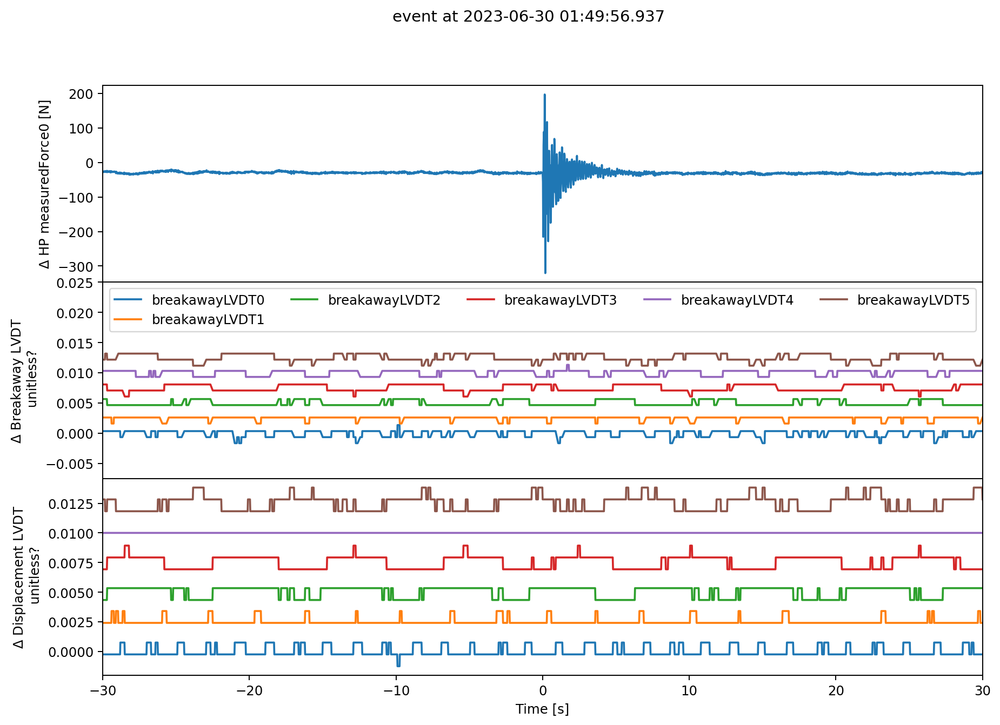

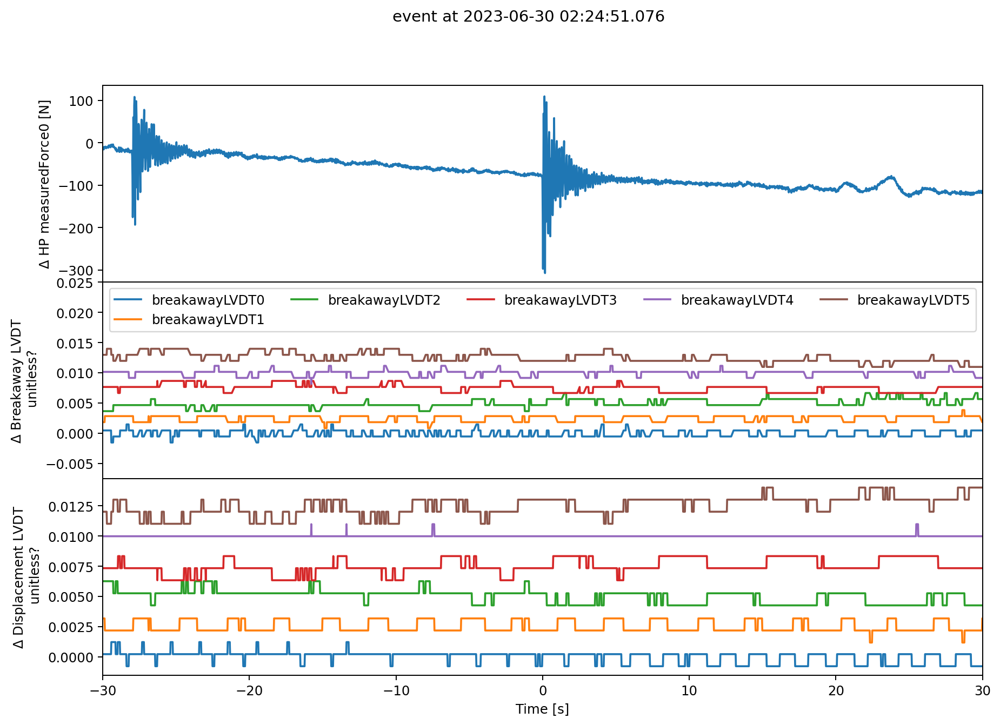

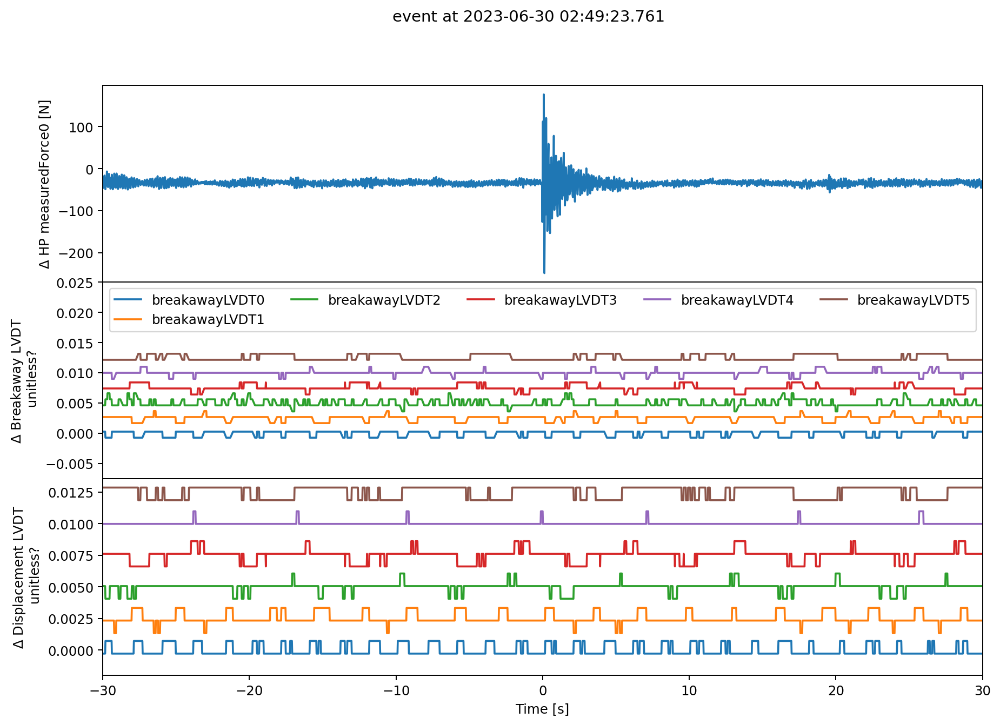

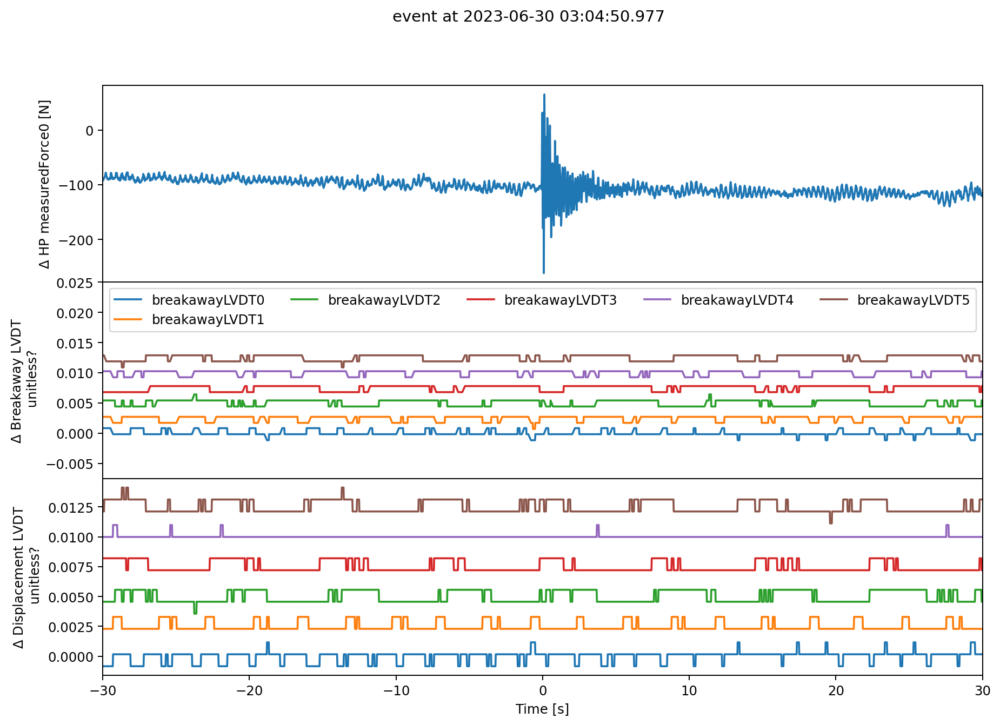

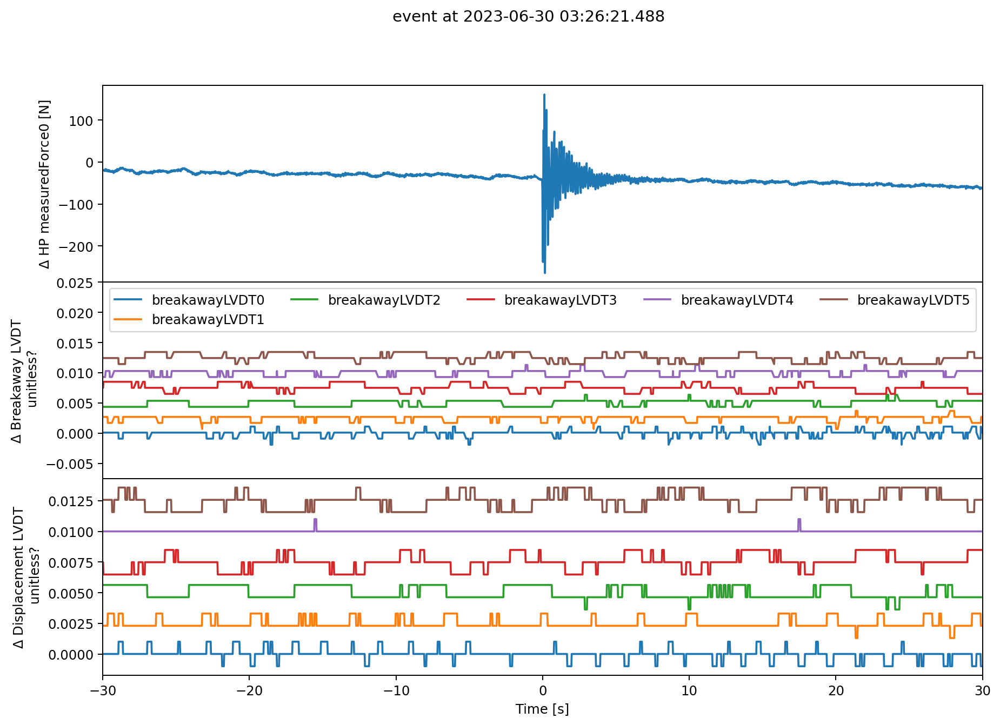

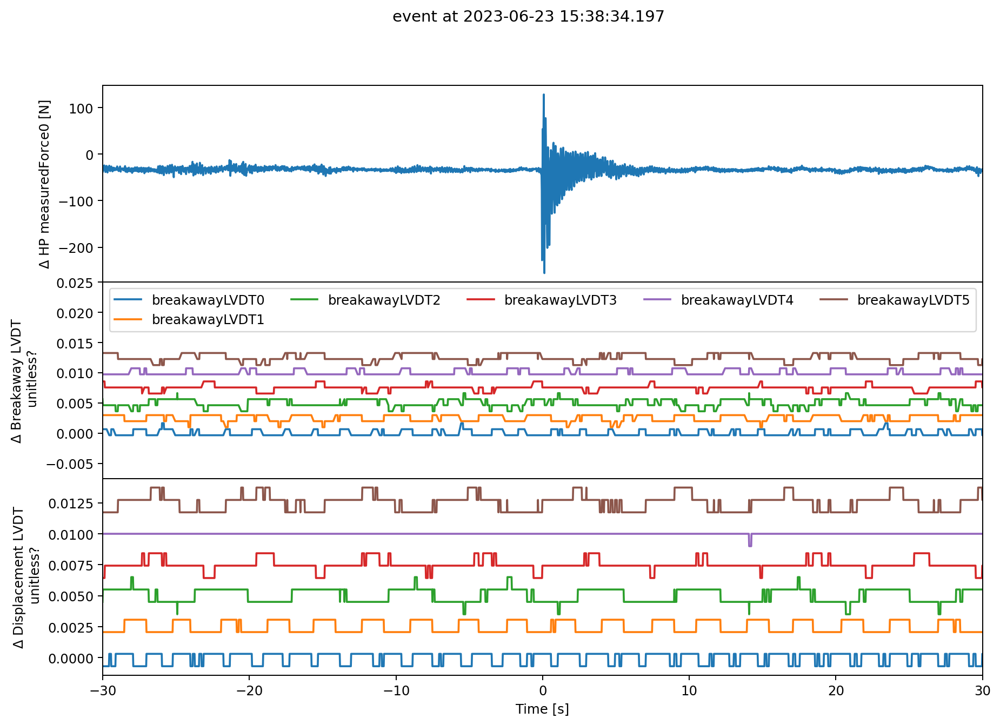

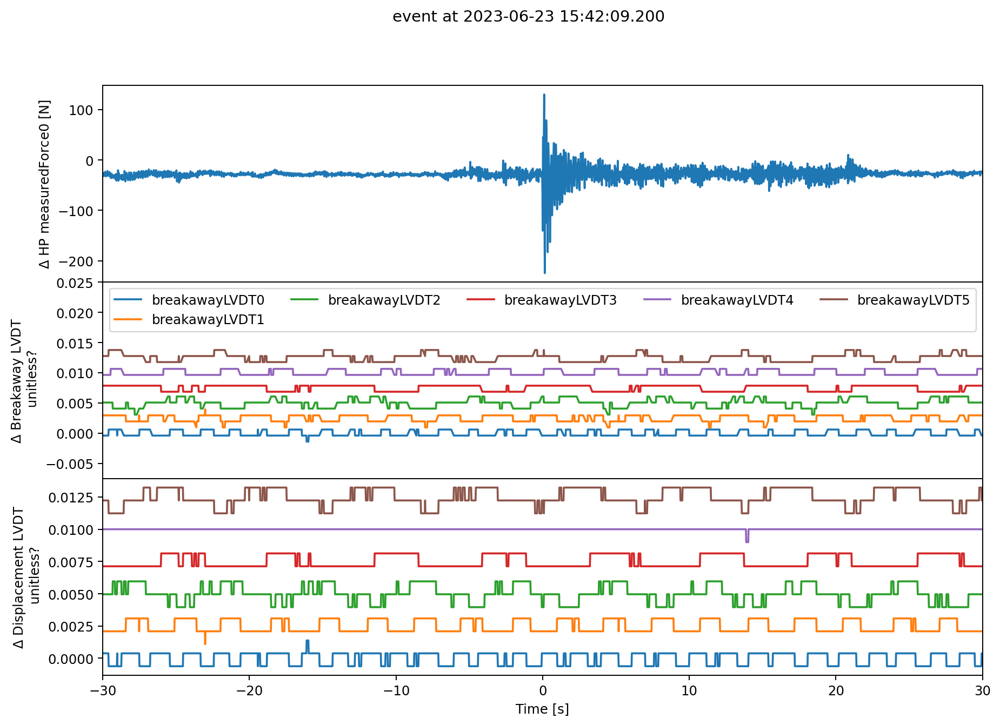

In [48]:
rmean_window=1
for j in [0,1,2,3,4,5,6]:
    event_time=Time(events_frame["times"][j]-2, format="unix")
    prePadding=40
    df_m1m3_hp_0=getEfdData(client,"lsst.sal.MTM1M3.hardpointActuatorData",  
                            begin=event_time, 
                            end=event_time, 
                            prePadding=prePadding, 
                            postPadding=40)
    df_m1m3_hmd=getEfdData(client,"lsst.sal.MTM1M3.hardpointMonitorData",
                           begin=event_time, 
                            end=event_time, 
                            prePadding=prePadding, 
                            postPadding=40)
    
    nax=3
    fig, axs=plt.subplots(nax,dpi=175, figsize=(12,2.7*nax), sharex=True)
    ax=axs[0]
    plt.suptitle(f"event at {event_time.iso}")
    ax.plot(df_m1m3_hp_0["private_efdStamp"] - df_m1m3_hp_0["private_efdStamp"][0] -prePadding ,
             df_m1m3_hp_0["measuredForce0"])
    ax.set_xlim(-30,30)
    ax.set_ylabel("$\Delta$ HP measuredForce0 [N]")
    ax=axs[1]
    for i in np.arange(6):
        # plt.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - 28,
        #          df_m1m3_hmd[f"breakawayLVDT{i}"].rolling(200).mean()- df_m1m3_hmd[f"breakawayLVDT{i}"].mean() + i * 0.05,
        #          label=f"breakawayLVDT{i}")\
        sel=abs(df_m1m3_hmd[f"breakawayLVDT{i}"]- df_m1m3_hmd[f"displacementLVDT{i}"]) > 0.001
        oval=0.0025
        vals=df_m1m3_hmd[f"breakawayLVDT{i}"][sel] - df_m1m3_hmd[f"displacementLVDT{i}"][sel]
        offset=vals.mean() - i * oval
        ax.plot(df_m1m3_hmd["private_efdStamp"][sel] - df_m1m3_hmd["private_efdStamp"][0] - prePadding ,
             vals- offset,
             label=f"breakawayLVDT{i}")
    ax.set_ylim(-3*oval, (i +5. )*oval)
    
    ax.set_ylabel("$\Delta$ Breakaway LVDT \n unitless?")
    ax.legend(ncol=5, loc=1)
    ax.set_xlim(-30,30)
    
    ax=axs[2]
    for i in np.arange(6):
        oval=0.0025
        offset=df_m1m3_hmd[f"displacementLVDT{i}"].mean() - i * oval
        ax.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - prePadding,
             df_m1m3_hmd[f"displacementLVDT{i}"].rolling(rmean_window).mean()- offset)
     
    ax.set_ylabel("$\Delta$ Displacement LVDT \n unitless?")
    # ax=axs[3]
    # for i in np.arange(6):
    #     oval=0.05
    #     offset=df_m1m3_hmd[f"breakawayPressure{i}"].mean() - i * oval
    #     plt.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - prePadding,
    #          df_m1m3_hmd[f"breakawayPressure{i}"].rolling(rmean_window).mean() - offset )
    # ax.set_ylabel("$\Delta$ breakawayPressure \n unitless?")
    ax.set_xlabel("Time [s]")  
    ax.set_xlim(-30,30)
    plt.subplots_adjust(hspace=0)
    plt.savefig(f"../plots/lvdt_summary_during_osc_{j}.png")

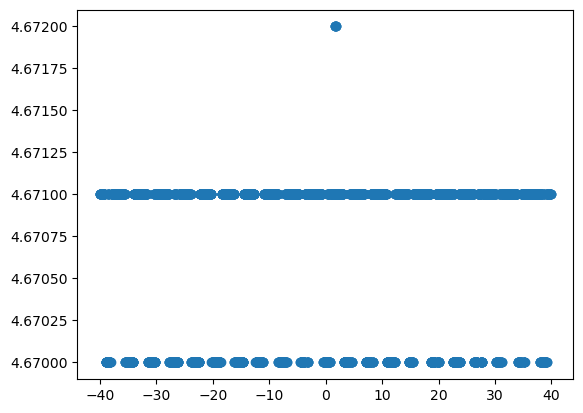

In [34]:
i=4
sel=abs(df_m1m3_hmd[f"breakawayLVDT{i}"]- df_m1m3_hmd[f"displacementLVDT{i}"]) > 0.01
plt.scatter(df_m1m3_hmd["private_efdStamp"][sel] - df_m1m3_hmd["private_efdStamp"][0] - prePadding ,
             df_m1m3_hmd[f"breakawayLVDT{i}"][sel],
             label=f"breakawayLVDT{i}")
# plt.scatter(df_m1m3_hmd["private_efdStamp"][sel] - df_m1m3_hmd["private_efdStamp"][0] - prePadding ,
#              df_m1m3_hmd[f"displacementLVDT{i}"][sel],
#              label=f"breakawayLVDT{i}")

In [8]:
mean_dict={}
for col in [ col for col in df_m1m3_hp.columns if "measuredForce" in col]:
    for suffux in ["_before", "_after"]:
        mean_dict[col + suffux]=[]
for col in events_frame.columns:
     mean_dict[col]=[]
for j , time in enumerate(events_frame["times"]):
    prePadding=4
    event_time=Time(events_frame["times"][j]-2, format="unix")
    df_m1m3_hp=getEfdData(client,"lsst.sal.MTM1M3.hardpointActuatorData",  
                            begin=event_time, 
                            end=event_time, 
                            prePadding=1, 
                            postPadding=2)
   
    
    for col in events_frame.columns:
        mean_dict[col].append(events_frame[col][j])
    for col in [ col for col in df_m1m3_hp.columns if "measuredForce" in col]:
        mean_dict[col + "_before"].append(df_m1m3_hp[col].values[0:100,].mean())
        mean_dict[col + "_after"].append(df_m1m3_hp[col].values[-100:,].mean())
        
        

NameError: name 'df_m1m3_hp' is not defined

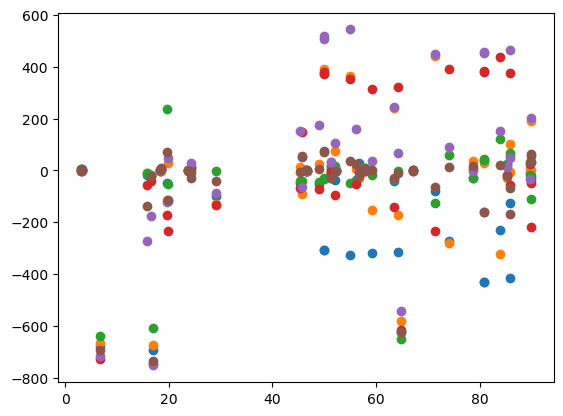

In [31]:
for col in [ col for col in df_m1m3_hp.columns if "measuredForce" in col]:
    plt.scatter(mean_dict["elevation_position"], mean_dict[col + "_before"])


In [38]:
np.array(mean_dict[col + "_before"]) - np.array(mean_dict[col + "_after"])

array([  2.19362437,  -0.11917442,  -8.27867771,   4.32031969,
        -4.29334334,  -3.33926722,   0.67338515,   7.85729983,
       -10.0977055 ,   4.35651601,  -3.94025968,  -2.15776966,
         3.67220359,   3.9546019 ,   1.90986005, -25.64395926,
         2.53714646,   1.75005071,  -0.72802096,  -3.57624967,
       -98.73699299, -97.26353596, -20.31834185, -58.32465706,
       -11.0415377 ,   0.55113764,  26.16538853,  15.33010042,
        28.22003365, -60.71838455, -56.6343635 ,  -5.52298714,
         5.26893089, -27.99705135,   1.80229736,  -3.0080365 ,
         0.77138947,  10.18170809,  -2.497194  ,   1.72375687,
        -2.9073033 ,  22.07624613,  24.65027147, -26.13602197,
       -38.93683018, -22.60177336, -37.42649357, -37.42649357,
        -1.95117841,  21.5213523 ])

In [67]:
mean_frame=pd.DataFrame(mean_dict)
pure=pd.read_csv("pure.csv")
sel=(pure["val"]==1)

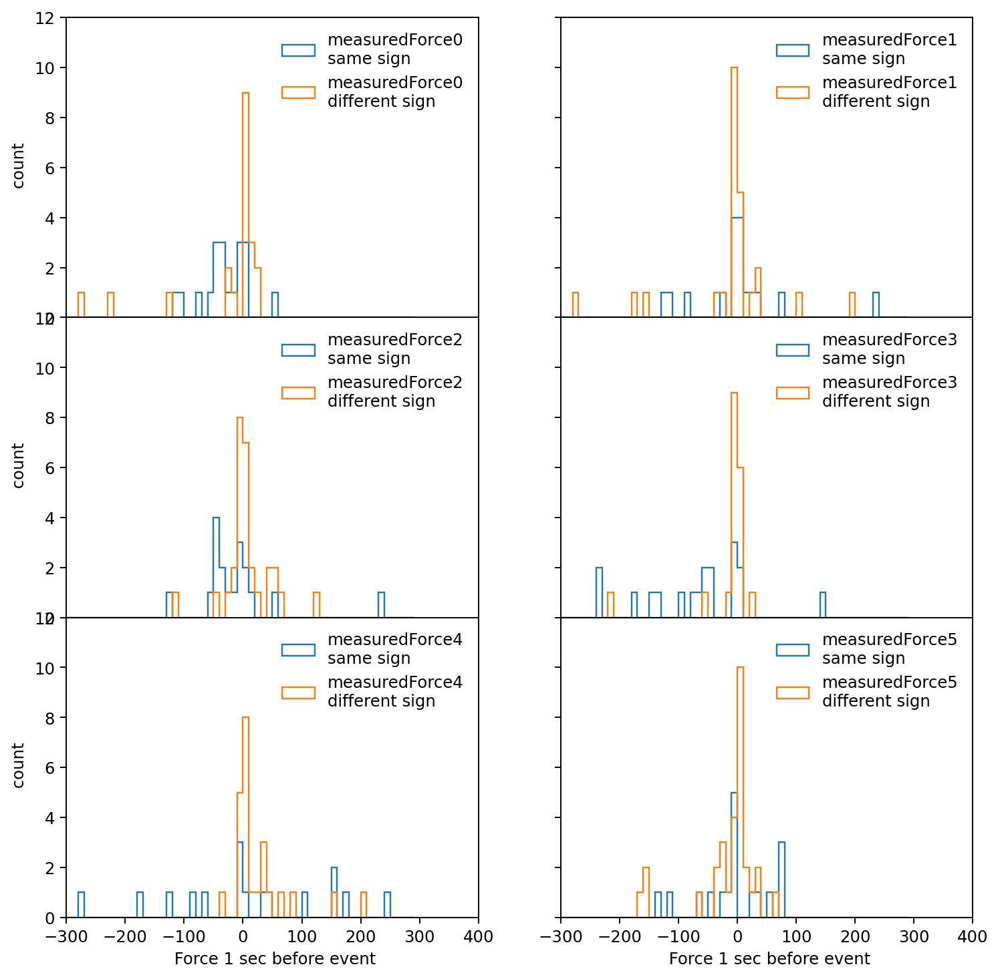

In [109]:
fig, axs=plt.subplots(3,2, dpi=175, figsize=(10,10), sharex=True, sharey=True)
for i,col in enumerate([ col for col in df_m1m3_hp.columns if "measuredForce" in col]):
    ax=axs[floor(i/2), i%2]
    sel2=sel & ((mean_frame[col + "_after"] *  mean_frame[col + "_before"]) > 0)
    bins=np.arange(-300,300,10)
    ax.hist(mean_frame[col + "_before"][sel2] , bins=bins, histtype="step", 
            label=col + "\nsame sign")
    ax.hist(mean_frame[col + "_before"][~sel2], bins=bins, histtype="step",
            label=col + "\ndifferent sign")
    ax.set_xlim(-300,400)           
    ax.set_ylim(0,12)
    ax.legend(edgecolor="None")
    if floor(i/2)==2:
        ax.set_xlabel(" Force 1 sec before event")
    if i%2 == 0:
        ax.set_ylabel(" count")
    plt.subplots_adjust(hspace=0)

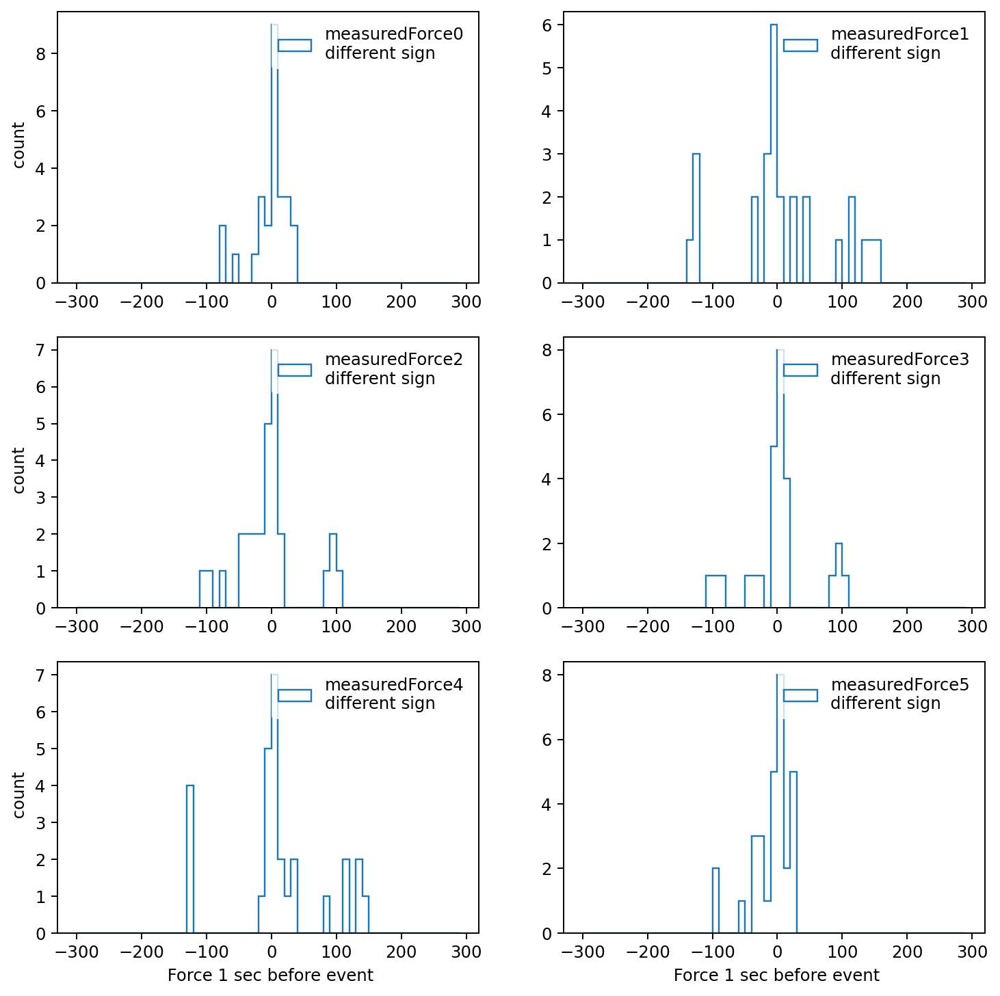

In [112]:
fig, axs=plt.subplots(3,2, dpi=175, figsize=(10,10))
for i,col in enumerate([ col for col in df_m1m3_hp.columns if "measuredForce" in col]):
    ax=axs[floor(i/2), i%2]
    sel2=sel & ((mean_frame[col + "_after"] *  mean_frame[col + "_before"]) > 0)
    bins=np.arange(-300,300,10)
    ax.hist(mean_frame[col + "_before"][~sel2] - mean_frame[col + "_after"][~sel2], bins=bins, histtype="step",
            label=col + "\ndifferent sign")
    #ax.set_xlim(-300,400)           
    #ax.set_ylim(0,12)
    ax.legend(edgecolor="None")
    if floor(i/2)==2:
        ax.set_xlabel(" Force 1 sec before event")
    if i%2 == 0:
        ax.set_ylabel(" count")
    #plt.subplots_adjust(hspace=0)

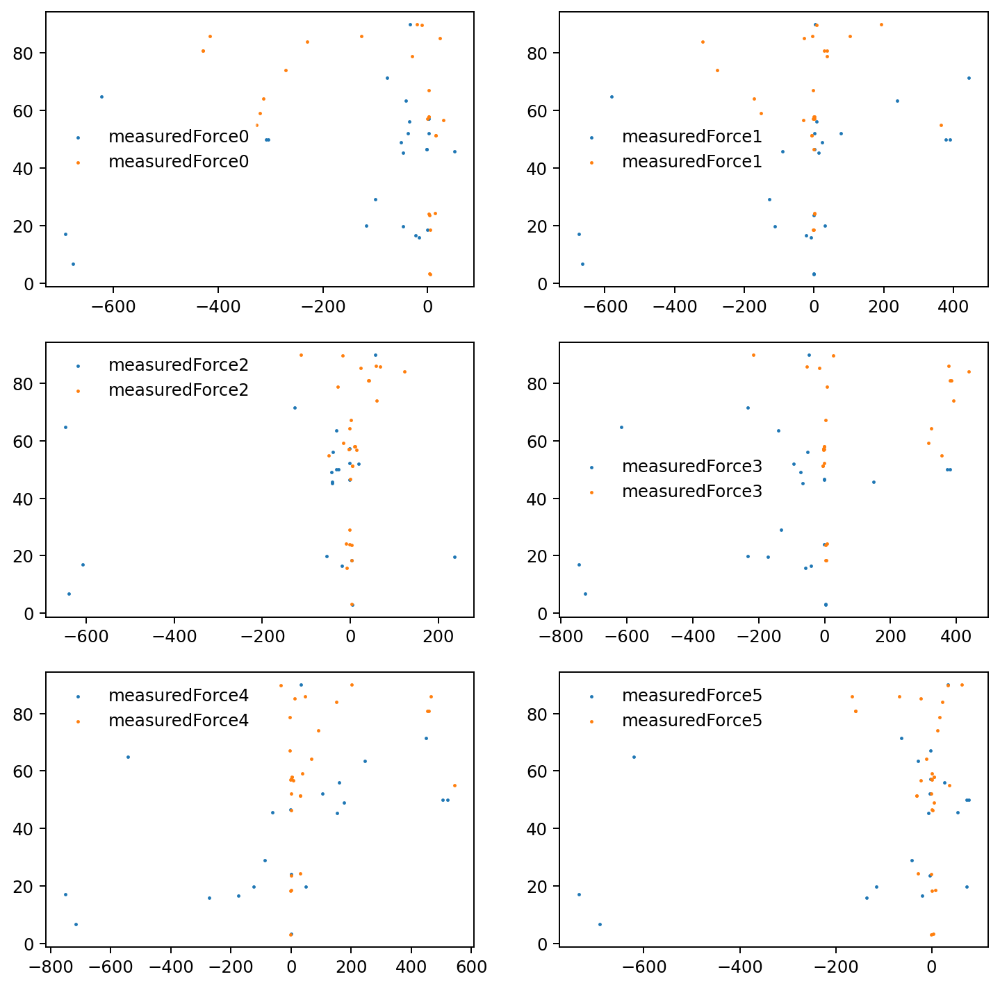

In [115]:
fig, axs=plt.subplots(3,2, dpi=175, figsize=(10,10))
for i,col in enumerate([ col for col in df_m1m3_hp.columns if "measuredForce" in col]):
    ax=axs[floor(i/2), i%2]
    sel2=sel & ((mean_frame[col + "_after"] *  mean_frame[col + "_before"]) > 0)
    ax.scatter(mean_frame[col + "_before"][sel2], 
               mean_frame["elevation_position"][sel2], 
               label=col,
               s=1)
    ax.scatter(mean_frame[col + "_before"][~sel2], 
               mean_frame["elevation_position"][~sel2], 
               label=col,
               s=1)
    ax.legend(edgecolor="None")

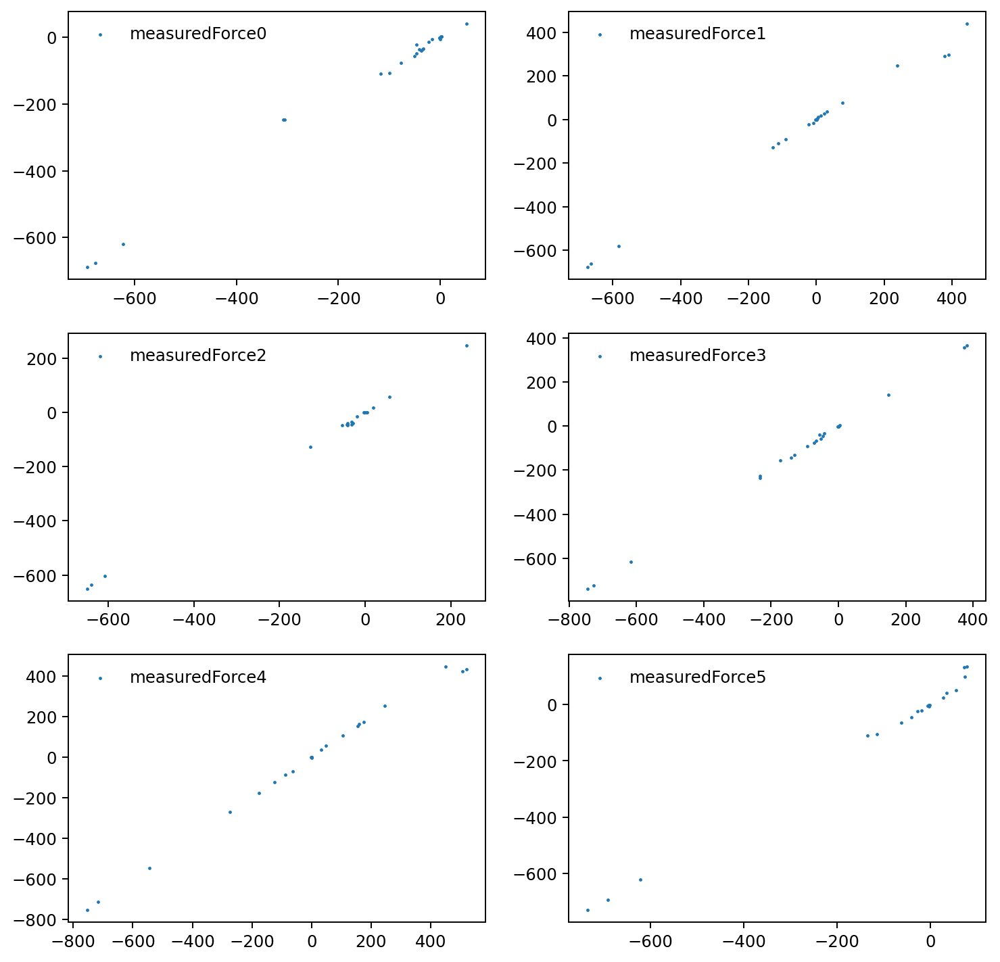

In [75]:
fig, axs=plt.subplots(3,2, dpi=175, figsize=(10,10))
for i,col in enumerate([ col for col in df_m1m3_hp.columns if "measuredForce" in col]):
    ax=axs[floor(i/2), i%2]
    sel2=sel & ((mean_frame[col + "_after"] *  mean_frame[col + "_before"]) > 0)
    ax.scatter(mean_frame[col + "_before"][~sel2], 
               mean_frame[col + "_after"][~sel2], 
               label=col,
               s=1)
    ax.legend(edgecolor="None")

In [110]:
mean_dict={}
for col in [ col for col in df_m1m3_hmd.columns if "pressureSensor" in col]:
    mean_dict[col]=[]
for col in [ col for col in df_m1m3_hmd.columns if "breakawayPressure" in col]: 
    mean_dict[col]=[]
for col in events_frame.columns:
     mean_dict[col]=[]
for j , time in enumerate(events_frame["times"]):
    prePadding=4
    df_m1m3_hp_0=getEfdData(client,"lsst.sal.MTM1M3.hardpointActuatorData",  
                            begin=event_time, 
                            end=event_time, 
                            prePadding=prePadding, 
                            postPadding=4)
    event_time=Time(events_frame["times"][j]-2, format="unix")
    df_m1m3_hmd=getEfdData(client,"lsst.sal.MTM1M3.hardpointMonitorData",
                           begin=event_time, 
                            end=event_time, 
                            prePadding=prePadding, 
                            postPadding=4)
    for col in events_frame.columns:
        mean_dict[col].append(events_frame[col][j])
    for col in [ col for col in df_m1m3_hmd.columns if "pressureSensor" in col]:
        mean_dict[col].append(df_m1m3_hmd[col].mean())
    for col in [ col for col in df_m1m3_hmd.columns if "breakawayPressure" in col]:
        mean_dict[col].append(df_m1m3_hmd[col].mean())

/tmp/ipykernel_34049/2175743383.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs=plt.subplots(nax,dpi=175, figsize=(12,3*nax), sharex=True)


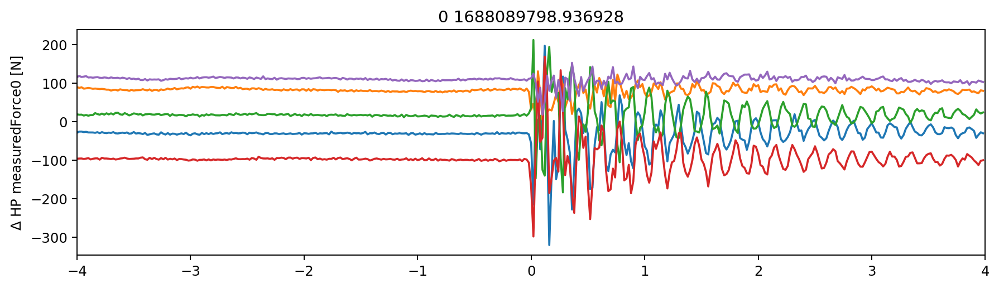

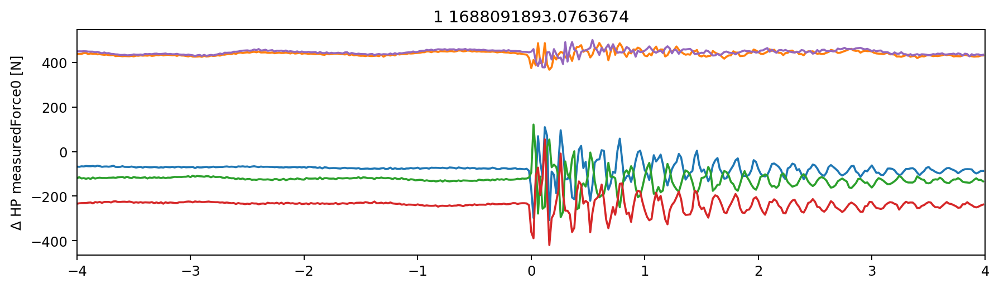

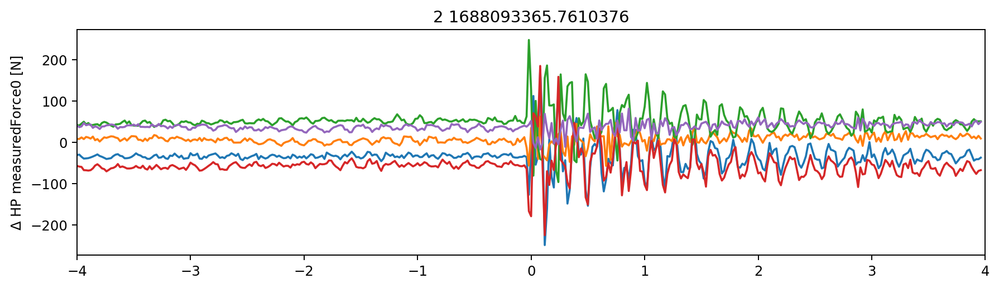

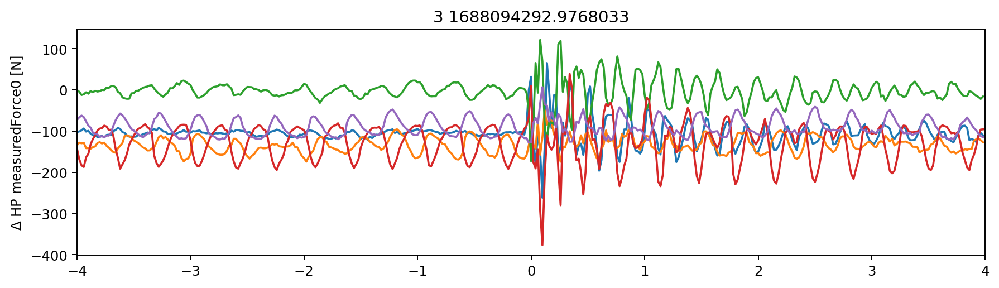

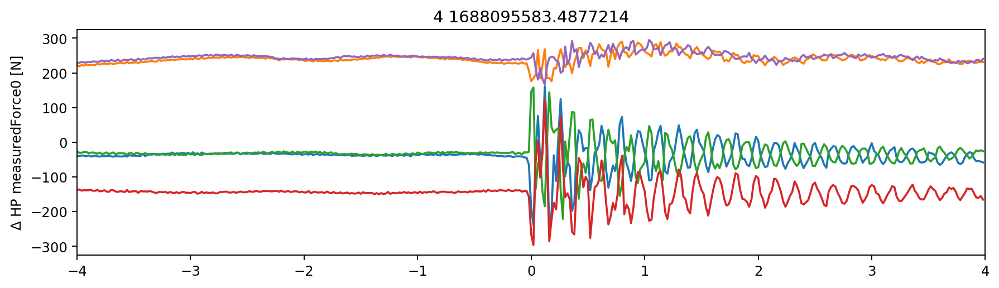

...

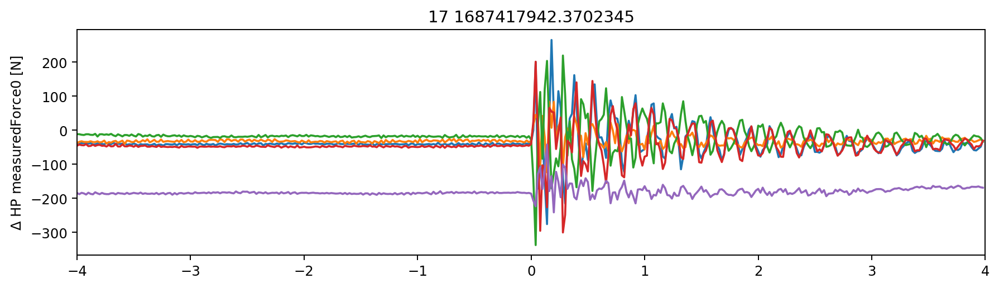

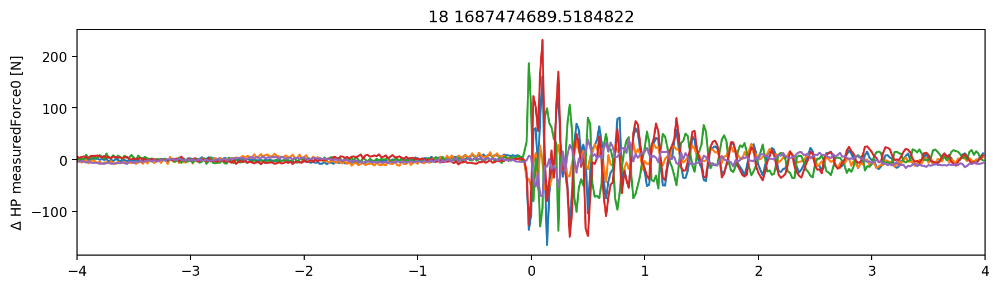

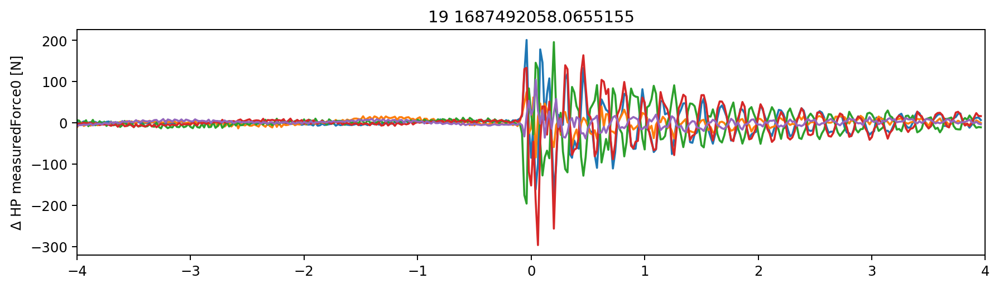

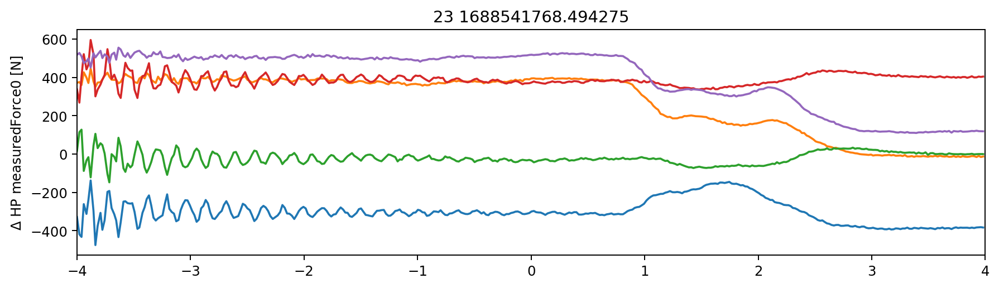

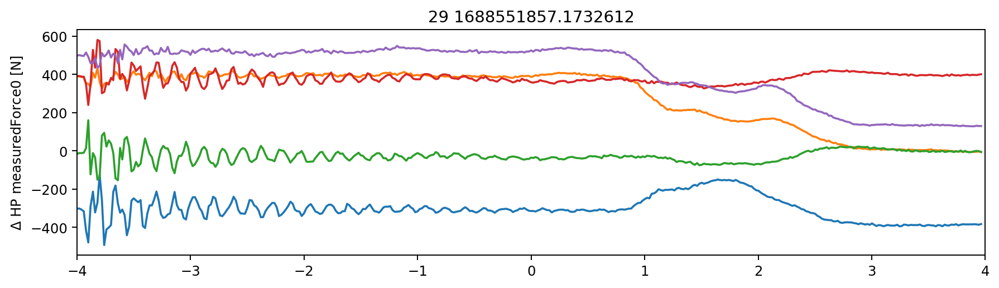

In [91]:
for j in np.arange(30) + 0:
    if pure["val"][j]==1:
        event_time=Time(events_frame["times"][j]-2, format="unix")
        prePadding=40
        df_m1m3_hp=getEfdData(client,"lsst.sal.MTM1M3.hardpointActuatorData",  
                                begin=event_time, 
                                end=event_time, 
                                prePadding=4, 
                                postPadding=4)

        nax=1
        fig, axs=plt.subplots(nax,dpi=175, figsize=(12,3*nax), sharex=True)
        ax=axs#[0]
        plt.title(f'{j} {events_frame["times"][j]}')
        for q in np.arange(5):
            ax.plot(df_m1m3_hp["private_efdStamp"] - df_m1m3_hp["private_efdStamp"][0] - 4 ,
                     df_m1m3_hp[f"measuredForce{q}"])
            ax.set_xlim(-4,4)
            ax.set_ylabel("$\Delta$ HP measuredForce0 [N]")

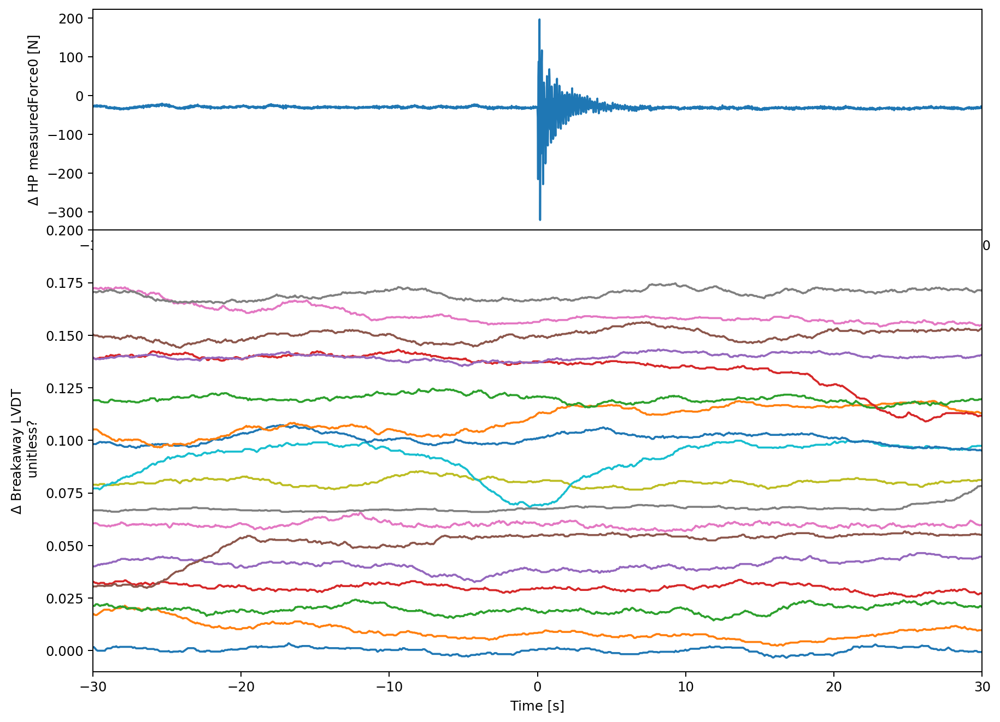

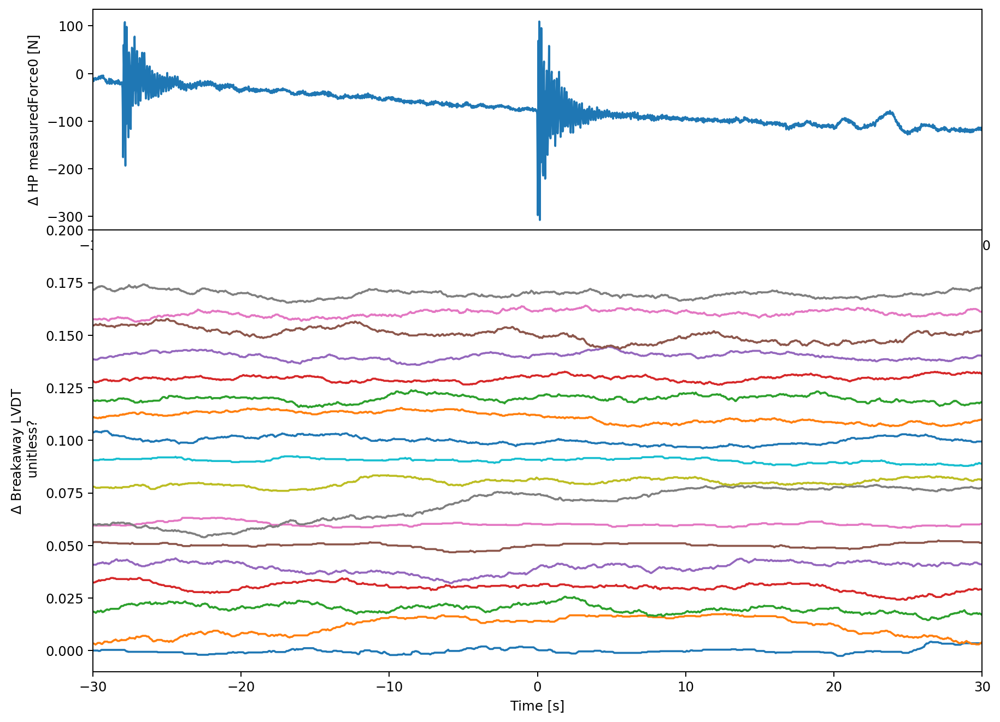

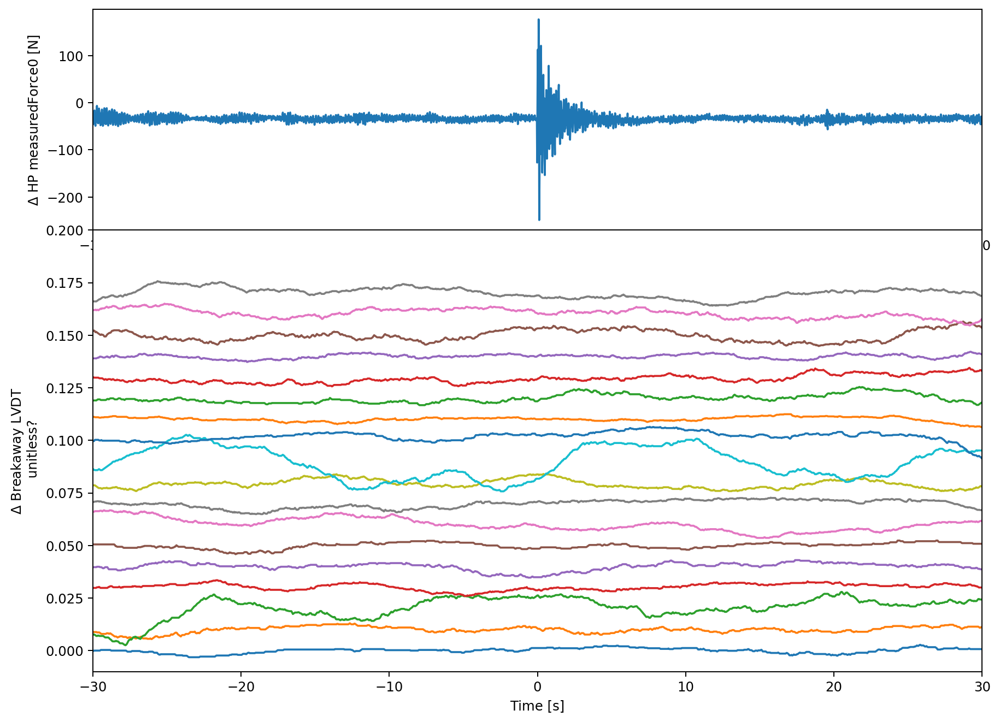

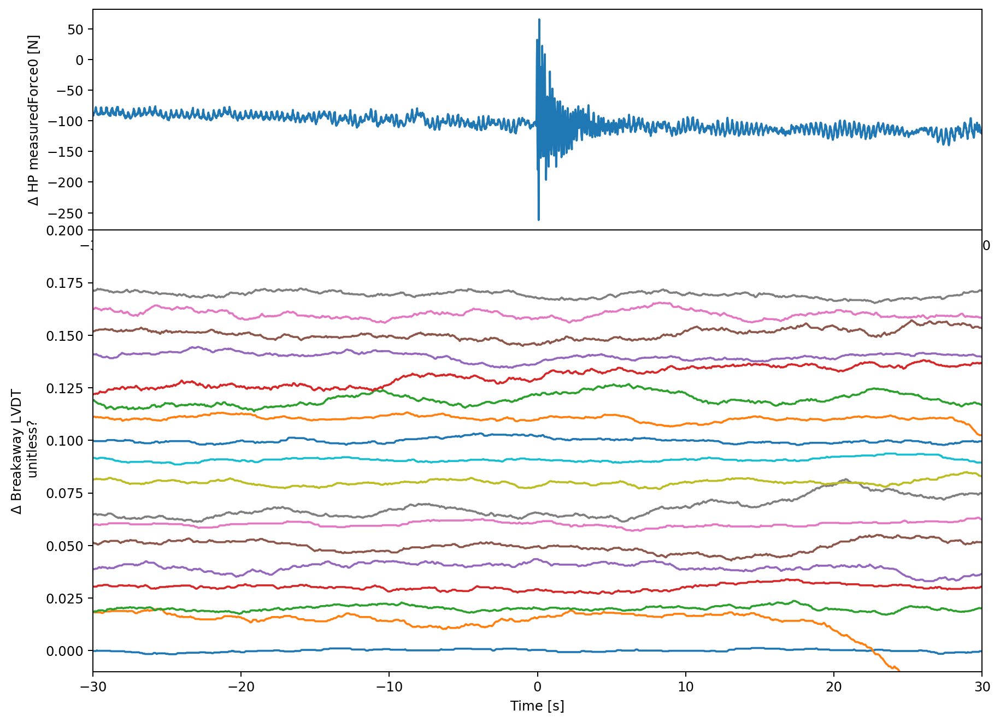

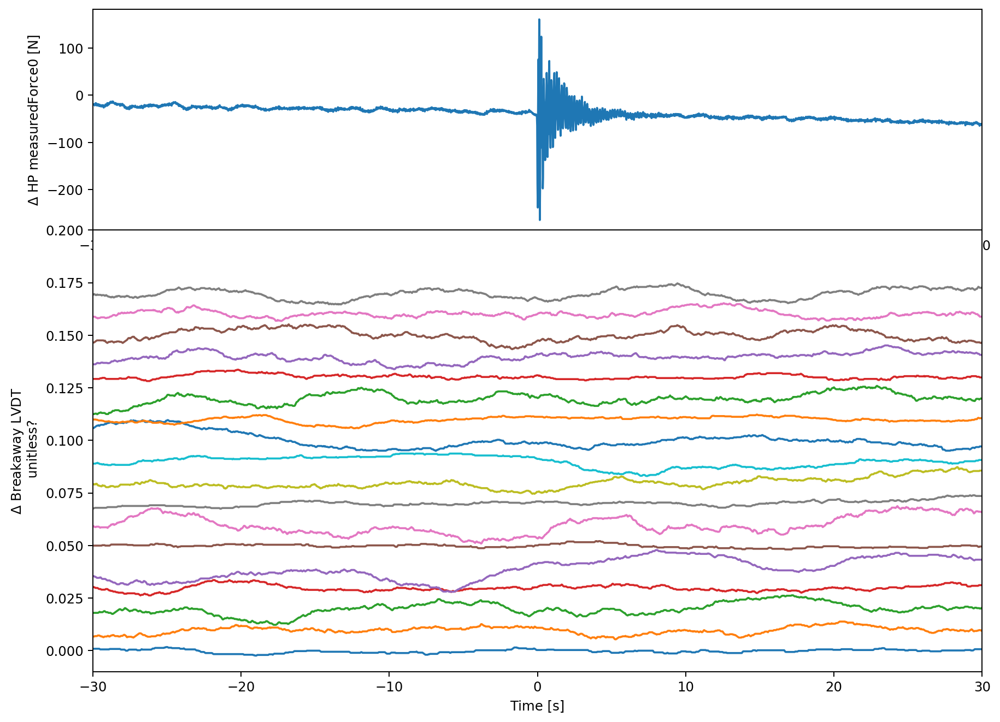

In [86]:
rmean_window=300
for j in np.arange(5):
    event_time=Time(events_frame["times"][j]-2, format="unix")
    prePadding=40
    df_m1m3_hp_0=getEfdData(client,"lsst.sal.MTM1M3.hardpointActuatorData",  
                            begin=event_time, 
                            end=event_time, 
                            prePadding=prePadding, 
                            postPadding=40)
    df_m1m3_hmd=getEfdData(client,"lsst.sal.MTM1M3.hardpointMonitorData",
                           begin=event_time, 
                            end=event_time, 
                            prePadding=prePadding, 
                            postPadding=40)
    
    nax=2
    fig=plt.figure(dpi=175, figsize=(12,3*(nax+1)))
    gs = fig.add_gridspec(3,1)
    ax=fig.add_subplot(gs[0, 0])
    
    ax.plot(df_m1m3_hp_0["private_efdStamp"] - df_m1m3_hp_0["private_efdStamp"][0] -prePadding ,
             df_m1m3_hp_0["measuredForce0"])
    ax.set_xlim(-30,30)
    ax.set_ylabel("$\Delta$ HP measuredForce0 [N]")
    ax=fig.add_subplot(gs[1:, 0])
    for i, col in enumerate([ col for col in df_m1m3_hmd.columns if "pressureSensor" in col]):
        # plt.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - 28,
        #          df_m1m3_hmd[f"breakawayLVDT{i}"].rolling(200).mean()- df_m1m3_hmd[f"breakawayLVDT{i}"].mean() + i * 0.05,
        #          label=f"breakawayLVDT{i}")\
        
        oval=0.01
        offset=df_m1m3_hmd[col].mean() - i * oval
        ax.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - prePadding ,
             df_m1m3_hmd[col].rolling(rmean_window).mean()- offset,
             label=f"breakawayLVDT{i}")
    ax.set_ylim(-oval, (i +3. )*oval)
    
    ax.set_ylabel("$\Delta$ Breakaway LVDT \n unitless?")
    #ax.legend(ncol=5, loc=1, title="6 sec rolling mean")
    ax.set_xlim(-30,30)
    
#     ax=axs[2]
#     for i in np.arange(6):
#         ax.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - prePadding,
#              df_m1m3_hmd[f"displacementLVDT{i}"].rolling(rmean_window).mean()- df_m1m3_hmd[f"displacementLVDT{i}"].rolling(100).mean() + i *0.0015)
#      
#     ax.set_ylabel("$\Delta$ Displacement LVDT \n unitless?")
#     ax=axs[3]
#     for i in np.arange(5):
#         plt.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - prePadding,
#              df_m1m3_hmd[f"pressureSensor{i + 10}"].rolling(rmean_window).mean() - df_m1m3_hmd[f"pressureSensor{i + 10}"].rolling(100).mean() + i * 0.1)
 
#     # ax=axs[4]
#     # for i in np.arange(6):
#     #     oval=1
#     #     offset=df_m1m3_hmd[f"breakawayLVDT{i}"].mean() - i * oval
#     #     ax.plot(df_m1m3_hmd["private_efdStamp"] - df_m1m3_hmd["private_efdStamp"][0] - prePadding ,
#     #          df_m1m3_hmd[f"breakawayLVDT{i}"].rolling(rmean_window).mean()- offset,
#     #          label=f"breakawayLVDT{i}")
#     #     breakawayLVDT0
    ax.set_xlabel("Time [s]")  
    ax.set_xlim(-30,30)
    plt.subplots_adjust(hspace=0)

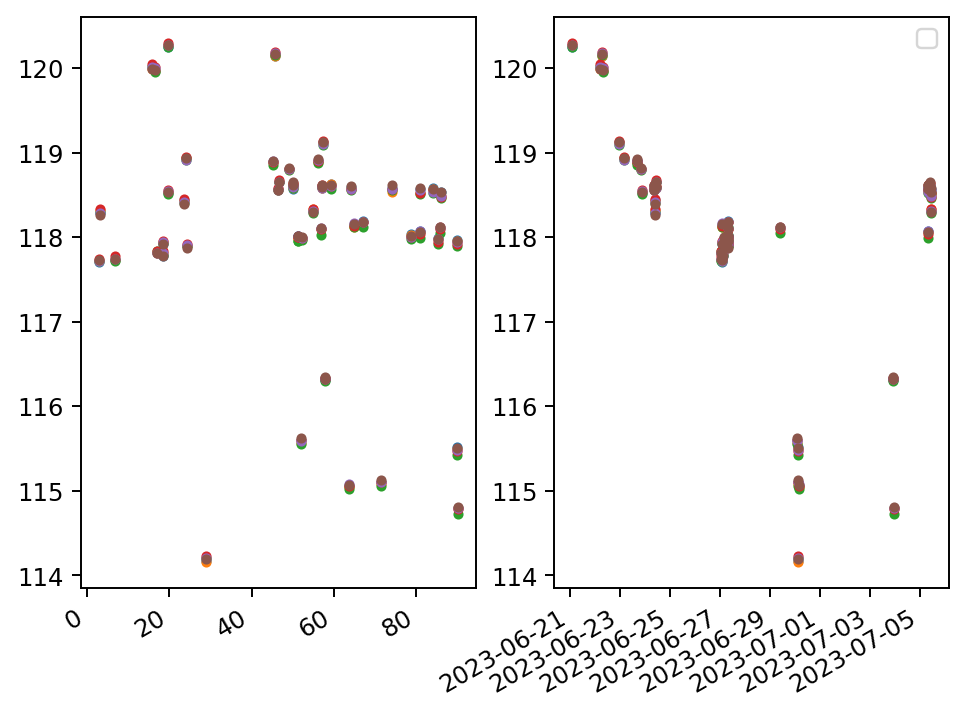

In [120]:
fig,axs=plt.subplots(1,2, dpi=175)
ax=axs[0]
for col in [ col for col in df_m1m3_hmd.columns if "breakawayPressure" in col]:
    ax.scatter(mean_dict["elevation_position"],mean_dict[col], label=col, s=10)
plt.legend()

ax=axs[1]
for col in [ col for col in df_m1m3_hmd.columns if "breakawayPressure" in col]:
    ax.scatter(Time(mean_dict["times"], format="unix").datetime,mean_dict[col], label=col, s=10)
fig.autofmt_xdate()